# Worksheet

[FORM](https://forms.gle/mJJXX1fX9F6EUL1s9)

### Hierarchical Clustering

Using the following dataset:

| Point | x | y |
|-------|---|---|
| A     | 0 | 0 |
| B     | 1 | 1 |
| C     | 3 | 0 |
| D     | 0 | 1 |
| E     | 2 | 2 |

with

d = Euclidean  
D = Single-Link

produce the distance matrix at every step of the hierarchical clustering algorithm.

Step 1

|   | A | B | C | D | E |
|---|---|---|---|---|---|
| A | 0 |   |   |   |   |
| B |   | 0 |   |   |   |
| C |   |   | 0 |   |   |
| D |   |   |   | 0 |   |
| E |   |   |   |   | 0 |

Step 2

|   |   |   |   |   |
|---|---|---|---|---|
|   | 0 |   |   |   |
|   |   | 0 |   |   |
|   |   |   | 0 |   |
|   |   |   |   | 0 |

Step 3

|   |   |   |   |
|---|---|---|---|
|   | 0 |   |   |
|   |   | 0 |   |
|   |   |   | 0 |

Step 4

|   |   |   |
|---|---|---|
|   | 0 |   |
|   |   | 0 |

Repeat the above with

d = Euclidean  
D = Complete-Link

Step 1

|   | A | B | C | D | E |
|---|---|---|---|---|---|
| A | 0 |   |   |   |   |
| B |   | 0 |   |   |   |
| C |   |   | 0 |   |   |
| D |   |   |   | 0 |   |
| E |   |   |   |   | 0 |

Step 2

|   |   |   |   |   |
|---|---|---|---|---|
|   | 0 |   |   |   |
|   |   | 0 |   |   |
|   |   |   | 0 |   |
|   |   |   |   | 0 |

Step 3

|   |   |   |   |
|---|---|---|---|
|   | 0 |   |   |
|   |   | 0 |   |
|   |   |   | 0 |

Step 4

|   |   |   |
|---|---|---|
|   | 0 |   |
|   |   | 0 |

## Density Based Clustering

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import sklearn.datasets as datasets

centers = [[1, 1], [-1, -1], [1, -1]]
X, _ = datasets.make_blobs(n_samples=750, centers=centers, cluster_std=0.4,
                            random_state=0)
plt.scatter(X[:,0],X[:,1],s=10, alpha=0.8)
plt.show()

class DBC():

    def __init__(self, dataset, min_pts, epsilon):
        self.dataset = dataset
        self.min_pts = min_pts
        self.epsilon = epsilon

    def dbscan(self):
        """
        returns a list of assignments. The index of the
        assignment should match the index of the data point
        in the dataset.
        """
        return

clustering = DBC(X, 3, .2).dbscan()
colors = np.array([x for x in 'bgrcmykbgrcmykbgrcmykbgrcmyk'])
colors = np.hstack([colors] * 20)
plt.scatter(X[:, 0], X[:, 1], color=colors[clustering].tolist(), s=10, alpha=0.8)
plt.show()

## Challenge Problem

Using the code above and the template provided below, create the animation below of the DBScan algorithm.

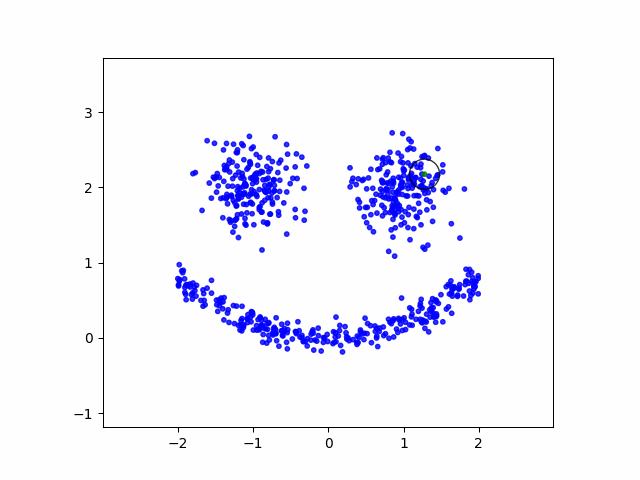

In [ ]:
from IPython.display import Image
Image(filename="dbscan_2.gif", width=500, height=500)

Hints:

- First animate the dbscan algorithm for the dataset used in class (before trying to create the above dataset)
- Take a snapshot of the assignments when the point gets assigned to a cluster
- Confirm that the snapshot works by saving it to a file
- Don't forget to close the matplotlib plot after saving the figure
- Gather the snapshots in a list of images that you can then save as a gif using the code below
- Use `ax.set_aspect('equal')` so that the circles don't appear to be oval shaped
- To create the above dataset you need two blobs for the eyes. For the mouth you can use the following process to generate (x, y) pairs:
  - Pick an x at random in an interval that makes sense given where the eyes are positioned
  - For that x generate y that is 0.2 * x^2 plus a small amount of randomness
  - `zip` the x's and y's together and append them to the dataset containing the blobs

In [ ]:
import numpy as np
from PIL import Image as im
import matplotlib.pyplot as plt
import sklearn.datasets as datasets

TEMPFILE = 'temp.png'

class DBC():

    def __init__(self, dataset, min_pts, epsilon):
        self.dataset = dataset
        self.min_pts = min_pts 
        self.epsilon = epsilon
        self.snaps = []


    def snapshot(self):
        fig, ax = plt.subplots()
        colors = ...

        ax.scatter(...)
        cir = plt.Circle(...) # create circle around the point assigned
        ax.add_patch(cir)
        ax.set_xlim(...)
        ax.set_ylim(...)
        ax.set_aspect('equal') # necessary or else the circles appear to be oval shaped

        fig.savefig(TEMPFILE)
        plt.close()

        return im.fromarray(np.asarray(im.open(TEMPFILE)))


    def dbscan(self):
        ...
        return


centers = [...]
eyes, _ = datasets.make_blobs(...)

mouth_x = ... * np.random.random(...)
mouth_y = ... + .1 * np.random.randn(...)

face = np.append(eyes, ..., axis=0)

dbc = DBC(face, ..., ...)
clustering = dbc.dbscan()

dbc.snaps[0].save(
    'dbscan.gif',
    optimize=False,
    save_all=True,
    append_images=dbc.snaps[1:],
    loop=0,
    duration=25
)